In this demo you can learn how to use deep neural netowrks to classify images
## Installing Requirements

In [ ]:
!pip install torch torchvision

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


**Get the CSV file**

In [ ]:
!wget http://home.sch.bme.hu/~haragosgergo/upload/KF_HF_database.zip
!unzip KF_HF_database.zip
!rm KF_HF_database.zip

--2022-11-18 14:18:49--  http://home.sch.bme.hu/~haragosgergo/upload/KF_HF_database.zip
Resolving home.sch.bme.hu (home.sch.bme.hu)... 152.66.208.100, 2001:738:2001:207b:0:208:100:0
Connecting to home.sch.bme.hu (home.sch.bme.hu)|152.66.208.100|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 40540 (40K) [application/zip]
Saving to: ‘KF_HF_database.zip’

KF_HF_database.zip  100%[===================>]  39.59K  --.-KB/s    in 0.1s    

2022-11-18 14:18:50 (355 KB/s) - ‘KF_HF_database.zip’ saved [40540/40540]

Archive:  KF_HF_database.zip
  inflating: KF_HF_database.csv      


**Create folders**

In [ ]:
!mkdir licens
!mkdir car1
!mkdir car2

**The Reader:**

In [ ]:
#@title
import csv
import torch
import numpy as np
import torch.nn as nn
import requests
import os


class Car:

  def __init__(self, license_plate: str,type_car: str, pic_1: str,pic_2: str,pic_3: str):
        self.license_plate =license_plate
        self.type_car = type_car
        self.pic_1 = pic_1
        self.pic_2 = pic_2
        self.pic_3 = pic_3




#render
class Render:


  def __init__(self, filename: str):
    self.filename = filename


  def execute(self):

    lista = list()
    with open(self.filename) as csvfile:
        spamreader = csv.reader(csvfile,delimiter=";")
        for row in spamreader:
            lista.append(Car(row[0],row[1],row[2],row[3],row[4]))
            #print(row)
    return lista   

class Downloader:

    headers ={
        'User-Agent': 'Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/107.0.0.0 Safari/537.36'
    }
    @staticmethod
    def download(url:str,mapa:str,id: int)->str:

      filename = str(id)+"_"+url.split('/')[-1].strip()
      image_data = requests.get(url,headers = Downloader.headers).content
      with open(os.path.join('/content/'+mapa,filename),'wb') as image:
        image.write(image_data)
      return filename


f = Render('KF_HF_database.csv')
lis = f.execute()
print(lis[0].pic_1)
i = 0
for l in lis:
   Downloader.download(l.pic_1,"licens",i)
   Downloader.download(l.pic_2,"car1",i)
   Downloader.download(l.pic_2,"car2",i)
   i+=1




http://img03.platesmania.com/220320/inf/186999633aa4cb.png


KeyboardInterrupt: ignored

**Draw the image** 

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).


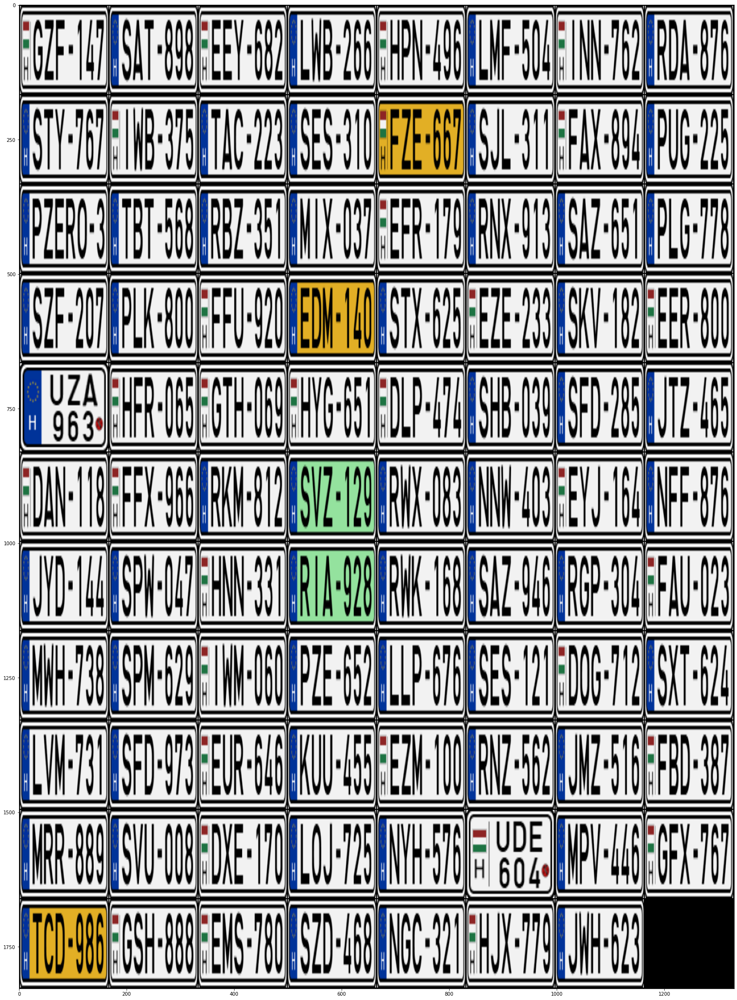

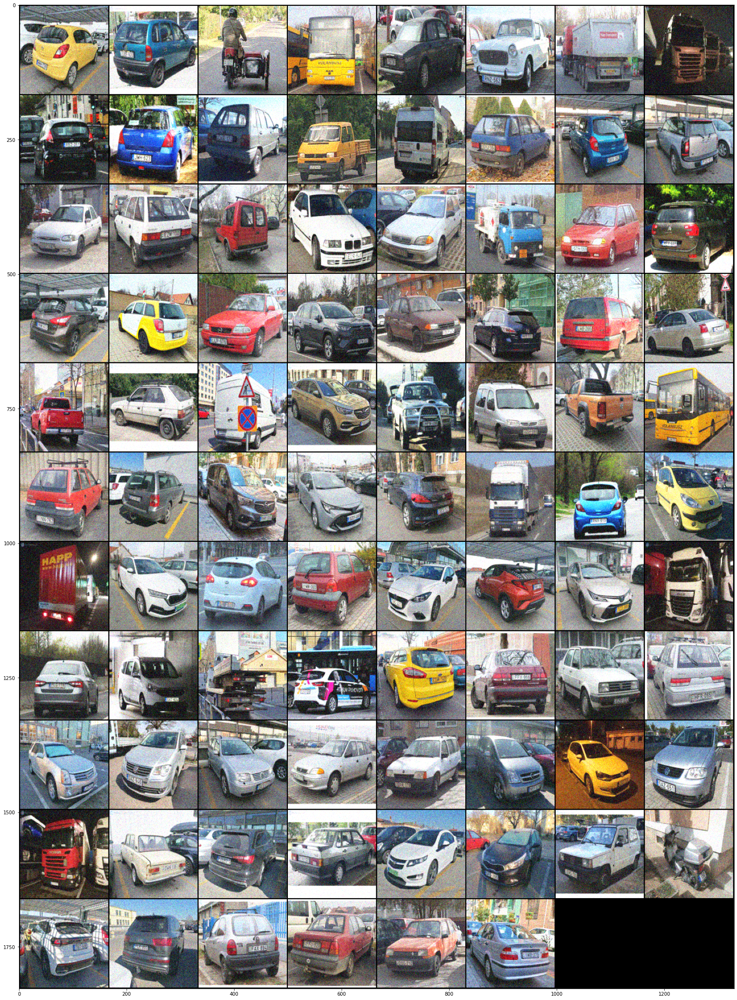

Hello


In [ ]:
# Import the required libraries
import torch
import torchvision
import torchvision.transforms as transforms
import matplotlib.pyplot as plt
import glob
from torch.utils.data import DataLoader,Dataset
from PIL import Image
import numpy as np
 
class FileList(Dataset):
  def __init__(self,image_list,transforms=None,t =0):
   self.image_list=image_list
   self.transforms=transforms
   self.t =t
  def __len__(self):
    return len(self.image_list)

  def __getitem__(self,i):
    img=plt.imread(self.image_list[i])
    if self.t == 0:
      img=Image.fromarray(img).convert('RGB')
      img=np.array(img).astype(np.uint8)
    else:
      img= np.array(Image.fromarray((img * 255).astype(np.uint8)).resize((200, 200)).convert('RGB'))
    
    
    if self.transforms is not None:
      img=self.transforms(img)
    return torch.tensor(img,dtype=torch.float)

  # def get_img(self,i:int):
  #   j = 1
  #   plt.figure(figsize = (50,50))
  #   n = len(self.files)
  #   for f in self.files:
  #     print(f)
  #     img = torchvision.io.read_image(self.path+f)
  #     img = torchvision.transforms.ToPILImage()(img)
      
  #     plt.subplot(1,n,j)
  #     plt.imshow(img,interpolation='nearest')
  #     j+=1

class AddGaussianNoise(object):
    def __init__(self, mean=0., std=1.):
        self.std = std
        self.mean = mean
        
    def __call__(self, tensor):
        return tensor + torch.randn(tensor.size()) * self.std + self.mean
    
    def __repr__(self):
        return self.__class__.__name__ + '(mean={0}, std={1})'.format(self.mean, self.std)





def show_img(img):
  plt.figure(figsize=(40,38))
  npimg=img.numpy()
  plt.imshow(np.transpose(npimg,(1,2,0)))
  plt.show()



img_list1=glob.glob('/content/licens/*.png')
img_list2=glob.glob('/content/car1/*.jpg')
img_list3=glob.glob('/content/car2/*.jpg')




transform=transforms.Compose([
                              transforms.ToPILImage(),
                              transforms.Resize((164,164)),
                              transforms.ToTensor(),
                              
                              ])

f1 = FileList(img_list1,transform,1)
transform=transforms.Compose([
                              transforms.ToPILImage(),
                              transforms.Resize((164,164)),
                              transforms.ToTensor(),
                              AddGaussianNoise(0.1, 0.08)
                              ])
f2 = FileList(img_list2,transform)

d = DataLoader(f1,batch_size=f1.__len__(),shuffle=True)
data=iter(d)
show_img(torchvision.utils.make_grid(data.next()))


d1 = DataLoader(f2,batch_size=f2.__len__(),shuffle=True)
data1=iter(d1)
show_img(torchvision.utils.make_grid(data1.next()))
# read a JPEG image
# img = torchvision.io.read_image('/content/licens/0_186999633aa4cb.png')

# img = torchvision.transforms.ToPILImage()(img)



# img.show()
print("Hello")
